In [1]:
import tifffile as tiff
import numpy as np

In [2]:
im = tiff.imread('./third_party/DaceyLab/z_10.84_to_z_3609_72-grayscale2-002.tif')

In [5]:
import matplotlib.pyplot as plt
%matplotlib inline

In [6]:
im.shape

(333, 2518, 4084)

In [64]:
im[0]

array([[136, 145, 195, ...,  97,  81, 106],
       [153, 203, 238, ...,  33,  32,  30],
       [211, 210, 193, ...,  49,  30,  23],
       ...,
       [ 62,  17,  15, ..., 177, 198, 130],
       [ 27,  21,  10, ..., 180, 173, 183],
       [ 64,  32,  17, ..., 187, 158, 170]], dtype=uint8)

/home/aman_arya524/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


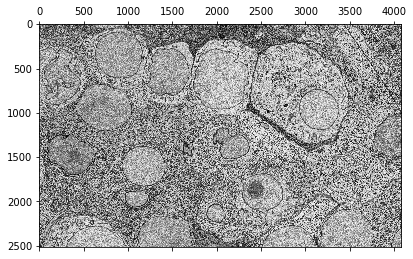

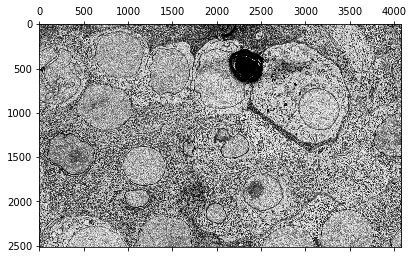

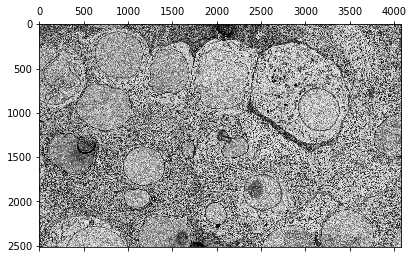

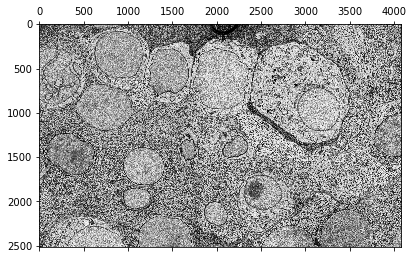

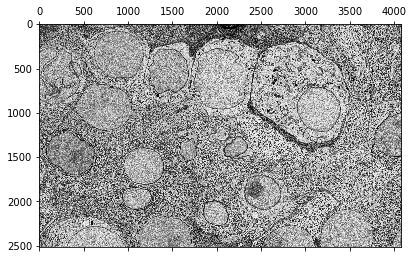

...

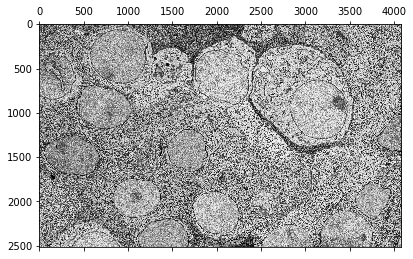

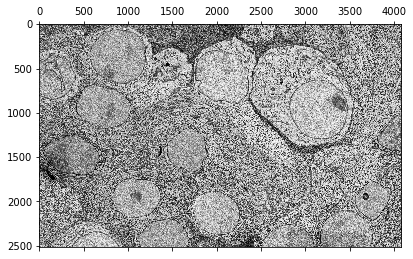

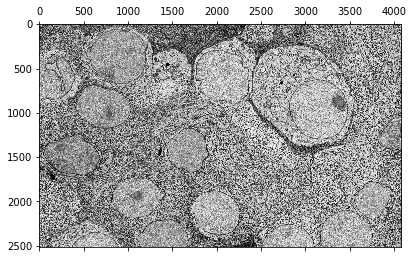

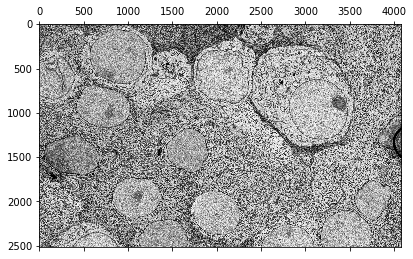

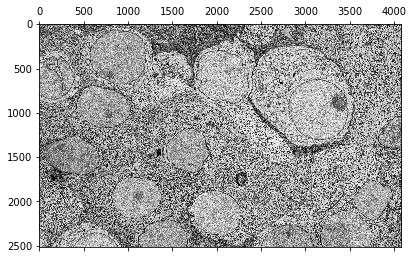

In [15]:
for i in range(0, 30):
    plt.matshow(im[i], cmap='gray')

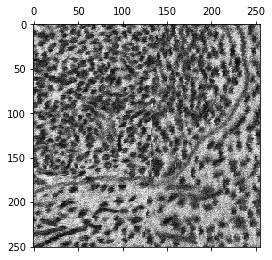

In [65]:
plt.matshow(im[0, 0:251, 0:255], cmap='gray')

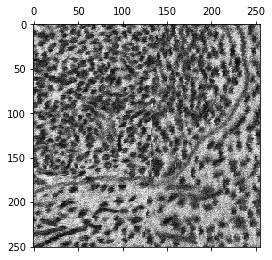

In [7]:
def extractImgs(im, l, w):
    imgList = []
    for i in range(round(im.shape[0] / l)):
        for j in range(round(im.shape[1] / w)):
            imgList.append(im[i*l:(i+1)*l, j*w:(j+1)*w])
    return imgList

im0 = extractImgs(im[0], 251, 255)
plt.matshow(im0[0], cmap='gray')

In [8]:
def extractAllImgs(imgs):
    allImgList = []
    for i in range(imgs.shape[0]):
        allImgList.append(extractImgs(imgs[i], 251, 255))
    return [item for sublist in allImgList for item in sublist]

images = extractAllImgs(im)
images = np.array(images)
images.shape

(53280, 251, 255)

In [10]:
import h5py

In [20]:
# with h5.File('./third_party/DaceyLab/small_2.h5', 'w') as f:
#     f.create_dataset('raw', data=images, compression='gzip')
#     print(list(f.keys()))
# f.close()

['raw']


In [17]:
images.shape

(35216, 251, 255)

In [19]:
with h5.File('./third_party/DaceyLab/z_10.84_to_z_3609_72-grayscale2-002_3.h5', 'w') as f:
    f.create_dataset('raw', data=images, compression='gzip')
    print(list(f.keys()))

['raw']


In [11]:
filename = './third_party/DaceyLab/z_10.84_to_z_3609_72-grayscale2-002_2.h5'
f = h5py.File(filename, 'r')

# List all groups
print("Keys: %s" % f.keys())
a_group_key = list(f.keys())[0]

# Get the data
images = np.array(f[a_group_key])
images.shape

Keys: <KeysViewHDF5 ['raw']>


(53280, 251, 255)

## Grayscale maps Flyem

In [22]:
f2 = h5.File('third_party/neuroproof_examples/validation_sample/grayscale_maps.h5', 'r')

In [23]:
list(f2.keys())

['raw']

In [113]:
flyem_gs = f2['raw']
flyem_gs.shape

(520, 520, 520)

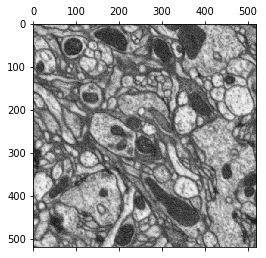

In [25]:
plt.matshow(flyem_gs[0], cmap='gray')

## Groundtruth Flyem

In [26]:
f3 = h5.File('third_party/neuroproof_examples/validation_sample/groundtruth.h5', 'r')

In [27]:
list(f3.keys())

['stack', 'synapse-annotations', 'transforms']

In [98]:
flyem_gt = f3['stack']
np.unique(flyem_gt[3])

array([   2,   10,   11,   12,   13,   16,   18,   21,   23,   24,   30,
         33,   34,   36,   40,   44,   47,   48,   49,   53,   57,   67,
         68,   72,   73,   87,   93,   94,  103,  107,  108,  116,  120,
        124,  125,  128,  142,  144,  146,  149,  154,  158,  161,  166,
        171,  185,  194,  199,  202,  204,  207,  209,  237,  240,  264,
        277,  318,  331,  372,  374,  382,  399,  419,  434,  451,  454,
        490,  492,  504,  523,  526,  531,  568,  571,  618,  621,  631,
        633,  635,  640,  652,  668,  669,  670,  681,  719,  730,  752,
        755,  768,  777,  836,  843,  847,  851,  873,  915,  925,  986,
       1001, 1011, 1037, 1075, 1077, 1090, 1121, 1126, 1130, 1135, 1154,
       1155, 1157, 1170, 1173, 1175, 1188, 1191, 1198, 1212, 1219, 1220,
       1233, 1246, 1258, 1261, 1274, 1313, 1323, 1342, 1348, 1378, 1387,
       1399, 1408, 1419, 1434, 1483, 1497, 1522, 1523, 1550, 1566, 1568,
       1572, 1591, 1592, 1602, 1612, 1627, 1633, 16

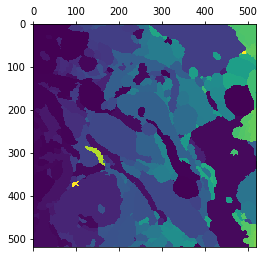

In [29]:
plt.matshow(flyem_gt[0])

## RGB

In [10]:
im_rgb = tiff.imread('./third_party/DaceyLab/z_10.84_to_z_3609_72-RGB2-003.tif')

In [11]:
im_rgb.shape

(333, 2518, 4084, 3)

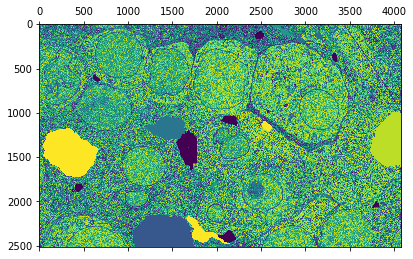

In [12]:
plt.matshow(im_rgb[0][...,0])

In [68]:
im_r = im_rgb[:][...,0]
im_r = extractAllImgs(im_r)
im_r = np.array(im_r)
im_r.shape

(53280, 251, 255)

In [13]:
import pandas as pd

obj_values = pd.read_excel('./third_party/DaceyLab/Object values.xlsx')
obj_values.head()

,object name,X pixel,Y pixel,z pixel depth,Z layer,R,G,B
0,cone 1 OFF midget bipolar,1774,1808,1842.80,171,0,255,0
1,cone 1 OFF? diffuse bipolar 6,108,1146,2601.60,241,137,255,137
2,cone 1 ON diffuse bipolar 2,3042,1208,1842.80,171,93,255,170
3,cone 12,63,1722,3186.96,295,0,255,123
4,cone 13,1398,2466,2905.12,269,214,255,0


In [14]:
obj_values.iloc[0]["R"]

0

In [15]:
def replaceBoolean(m, ix):
    m[m == 1] = ix + 2
    return m

In [16]:
(im_rgb[0][..., 0] == obj_values.iloc[0]["R"]).astype(int)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0]])

In [17]:
m = replaceBoolean((im_rgb[0][..., 0] == obj_values.iloc[0]["R"]) & (im_rgb[0][..., 1] == obj_values.iloc[0]["G"]) & (im_rgb[0][..., 2] == obj_values.iloc[0]["B"]).astype(int), 0)
m.shape

(2518, 4084)

In [ ]:
# Everything will be labeled by their index + 2
groundtruth = np.zeros(list(im.shape))
for i in range(im_rgb.shape[0]):
    print(str(i) + " out of " + str(im.shape[0]))
    for index, row in obj_values.iterrows():
        mask = replaceBoolean((im_rgb[i][..., 0] == row["R"]) & (im_rgb[i][..., 1] == row["G"]) & (im_rgb[i][..., 2] == row["B"]).astype(int), index)
        groundtruth[i] += mask

0 out of 333
1 out of 333
2 out of 333
3 out of 333


In [ ]:
groundtruth_div = extractAllImgs(groundtruth)
groundtruth_div = np.array(groundtruth_div)
groundtruth_div.shape

In [4]:
empty_ct = 0
nonempty_ct = 0

empty_i = []
nonempty_i = []
for i in range(groundtruth_div.shape[0]):
    if np.max(groundtruth_div[i]) != 0:
        nonempty_ct += 1
        nonempty_i.append(i)
    else:
        empty_ct += 1
        empty_i.append(i)

print(empty_ct / groundtruth_div.shape[0])
print(nonempty_ct / groundtruth_div.shape[0])

0.33903903903903904
0.6609609609609609


In [5]:
gt_list = list(groundtruth_div)
gt_list = [i for j, i in enumerate(gt_list) if j in nonempty_i]
groundtruth_div = np.array(gt_list)
groundtruth_div.shape

(35216, 251, 255)

In [12]:
im_list = list(images)
im_list = [i for j, i in enumerate(im_list) if j in nonempty_i]
images = np.array(im_list)
images.shape

(35216, 251, 255)

1


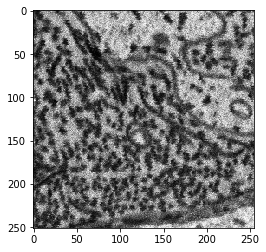

In [14]:
i = 1
plt.imshow(images[i], cmap='gray')
print(i)

array([0., 8.])

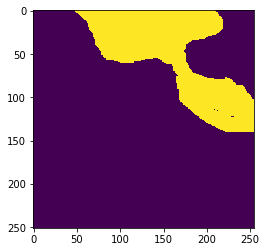

In [15]:
plt.imshow(groundtruth_div[i])
np.unique(groundtruth_div[i])

In [13]:
plt.imshow(im_r[i])

NameError: name 'im_r' is not defined

In [13]:
groundtruth_div1000 = groundtruth_div[:1000]
images_div1000 = images[:1000]

In [9]:
with h5py.File('./third_party/DaceyLab/z_10.84_to_z_3609_72-RGB2-003_1000.h5', 'w') as f:
    f.create_dataset('stack', data=groundtruth_div1000, compression='gzip')
    print(list(f.keys()))

['stack']


In [15]:
with h5py.File('./third_party/DaceyLab/z_10.84_to_z_3609_72-grayscale2-002_1000.h5', 'w') as f:
    f.create_dataset('raw', data=images_div1000, compression='gzip')
    print(list(f.keys()))

['raw']


In [2]:
import h5py
filename = './third_party/DaceyLab/z_10.84_to_z_3609_72-RGB2-003.h5'
f = h5py.File(filename, 'r')

# List all groups
print("Keys: %s" % f.keys())
a_group_key = list(f.keys())[0]

# Get the data
groundtruth_div = np.array(f[a_group_key])

Keys: <KeysViewHDF5 ['stack']>


(53280, 251, 255)